In [1]:
# load the data

import os
import glob 
from matplotlib.pyplot import rc_context
import seaborn as sns
import numpy as np
import pandas as pd
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()

import pickle  #upper threshold 값들을 저장하고 불러오기 위해서

In [2]:
save_file = './write/1129_leiden_01.h5ad'
adata = sc.read_h5ad(save_file)

In [3]:
adata

AnnData object with n_obs × n_vars = 1983 × 4892
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts', 'sample', 'batch', 'louvain', 'leiden', 'leiden_0.3', 'leiden_0.1', 'leiden_0.05'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_0.1_colors', 'leiden_0.3_colors', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [4]:
sc.tl.leiden(adata, key_added = "leiden")


running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


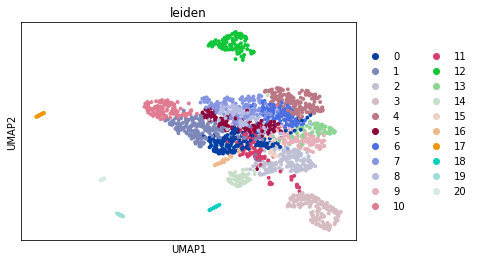

In [5]:
sc.pl.umap(adata, color=['leiden'])


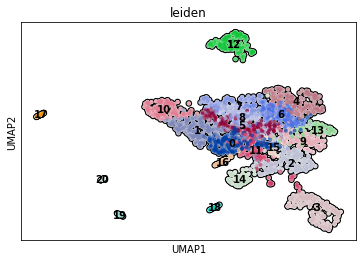

In [10]:
sc.pl.umap(adata, color=['leiden'], add_outline=True, legend_loc='on data')

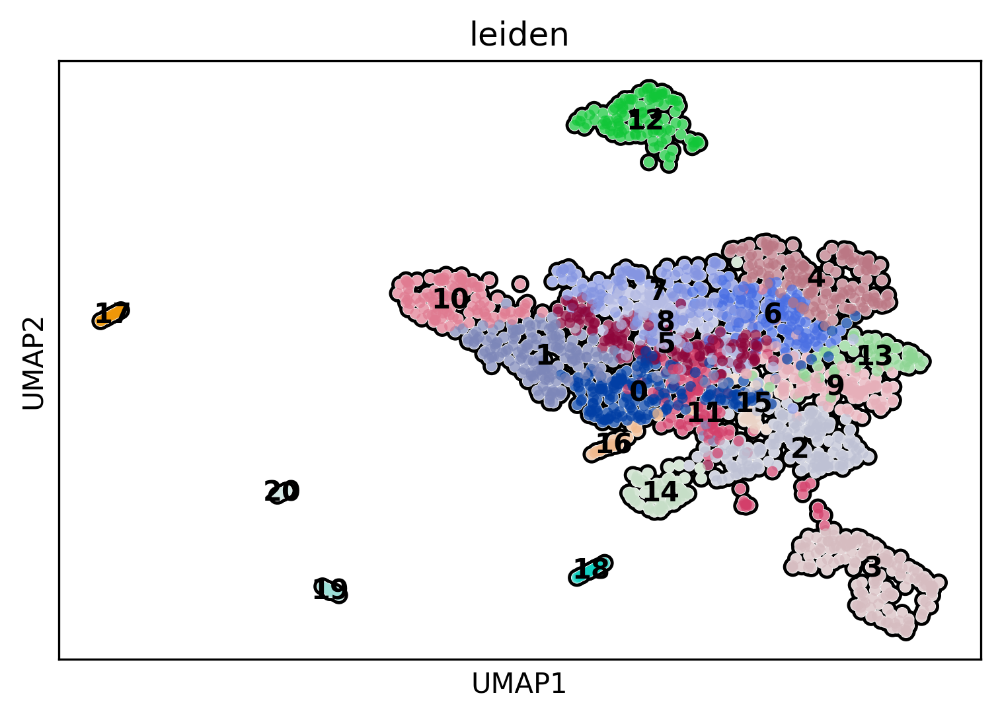

In [16]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300

with rc_context({'figure.figsize': (6, 4)}):
    sc.pl.umap(adata, color=['leiden'], add_outline=True, legend_loc='on data')




In [ ]:
groups=None

In [44]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


/Users/minsuyoo/opt/anaconda3/envs/cello_env/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/minsuyoo/opt/anaconda3/envs/cello_env/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/minsuyoo/opt/anaconda3/envs/cello_env/lib/python3.7/site-packages/scanpy/tools/_rank

In [38]:
sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


In [45]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)


,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,Lgals4,Nupr1,Cxcl14,Eng,Mt3,Nupr1,Ifitm1,Egr1,Gm26917,Hmgb2,...,mt-Atp8,Tm4sf4,Top2a,Ptn,Phgr1,Tff3,Il1r2,Lyz2,Nts,Apoa1
1,Xist,Fn1,Crlf1,Egfl7,Tbx3,2200002D01Rik,Ifitm3,Atf3,Gm26870,Cenpa,...,Lars2,Ambp,Pclaf,Sox2,Lgals4,Spink4,Ccr1,C1qc,Galnt18,Serpina3k
2,Noxo1,Pmepa1,Mt3,Aqp1,Wif1,Egln3,Mmp7,Chka,AC127341.3,Birc5,...,mt-Co3,Clu,Lig1,Atp1a2,Ckmt1,Ern2,Tyrobp,Ctss,Lrg1,Kng1
3,Ceacam1,Ly6a,Dapl1,Adgrf5,Nkd1,Mif,Hopx,Trib1,Arc,Cdc20,...,mt-Co2,Spp1,Cit,Ank2,Plac8,Muc13,Plek,Apoe,Egfl7,Serpina1e
4,Wfdc18,Basp1,Tspan1,Cdh5,Ptn,Bnip3,Smoc2,Errfi1,Fosl1,Ccnb2,...,mt-Nd5,C3,Gmnn,Aspscr1,Prss32,5330417C22Rik,Il1b,C1qb,Bcr,Mup3
5,Gpx2,S100a11,Tmem59l,Esam,Notum,Pgk1,Ogt,Hbegf,Eppk1,Ube2c,...,mt-Atp6,Mgst1,Hmgb2,Espn,Lypd8,Reg4,Cd53,Wfdc17,Mmrn1,Apoa2
6,Ppp1r1b,S100a6,Cpe,Arhgap31,Aspscr1,Vegfa,Snhg20,Junb,Nr4a1,Mki67,...,Gm42418,Bicc1,Tyms,Ifitm1,Tspan1,Guca2a,Csf2rb,Cd74,Gng11,F2
7,Hopx,Anxa3,Apoc4,Sparc,Nav2,Mt1,Prox1,Fosb,Tnf,Cks1b,...,mt-Nd1,Cp,Hells,Cxcl14,Muc13,Agr2,Il1rn,Tyrobp,Tie1,Fgb
8,Oit1,Cd44,Lhpp,Pecam1,Spock2,Aldoa,Tia1,Klf4,Gm47283,Nucks1,...,mt-Cytb,Tstd1,Gm47283,Selenop,Ppp1r14d,Oit1,Srgn,H2-Aa,Ramp2,Itih4
9,Agr2,Onecut2,Ly6k,Ptprb,Echdc2,Hk2,Gm26917,Cldn4,Fam83g,Cenpw,...,mt-Nd3,Hhex,Dut,Arl4a,2200002D01Rik,Selenom,Cebpb,C1qa,Sema3d,Hpx


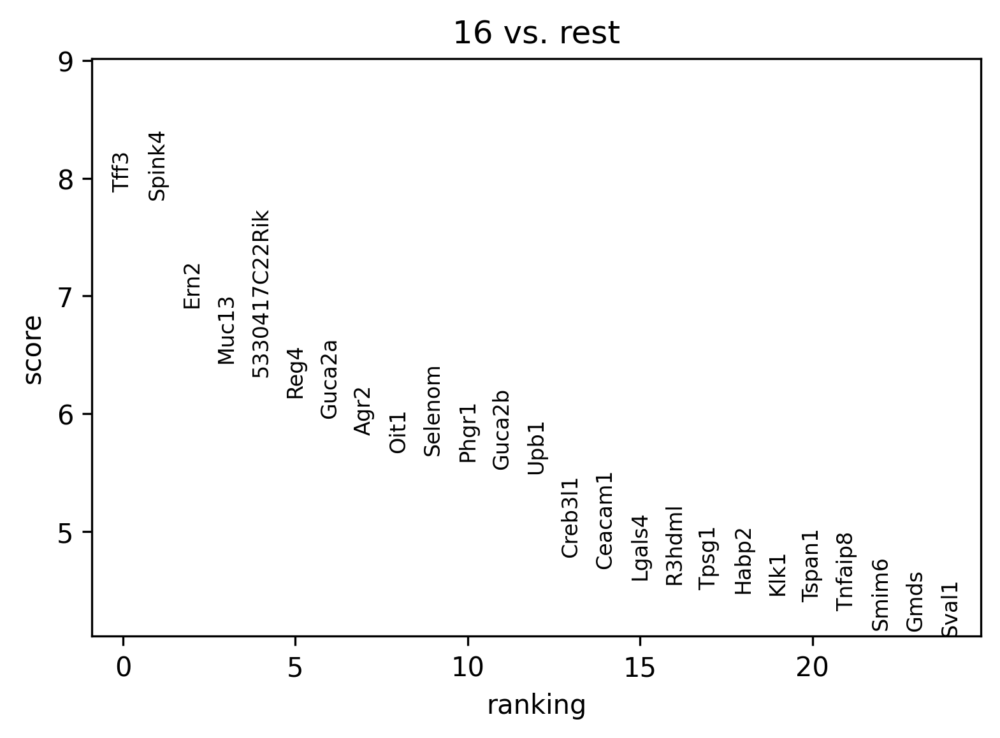

In [46]:
sc.pl.rank_genes_groups(adata, groups=['16'], n_genes=25)


In [47]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)


,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,Lgals4,Nupr1,Cxcl14,Eng,Mt3,Nupr1,Ifitm1,Egr1,Gm26917,Hmgb2,...,mt-Atp8,Tm4sf4,Top2a,Ptn,Phgr1,Tff3,Il1r2,Lyz2,Nts,Apoa1
1,Xist,Fn1,Crlf1,Egfl7,Tbx3,2200002D01Rik,Ifitm3,Atf3,Gm26870,Cenpa,...,Lars2,Ambp,Pclaf,Sox2,Lgals4,Spink4,Ccr1,C1qc,Galnt18,Serpina3k
2,Noxo1,Pmepa1,Mt3,Aqp1,Wif1,Egln3,Mmp7,Chka,AC127341.3,Birc5,...,mt-Co3,Clu,Lig1,Atp1a2,Ckmt1,Ern2,Tyrobp,Ctss,Lrg1,Kng1
3,Ceacam1,Ly6a,Dapl1,Adgrf5,Nkd1,Mif,Hopx,Trib1,Arc,Cdc20,...,mt-Co2,Spp1,Cit,Ank2,Plac8,Muc13,Plek,Apoe,Egfl7,Serpina1e
4,Wfdc18,Basp1,Tspan1,Cdh5,Ptn,Bnip3,Smoc2,Errfi1,Fosl1,Ccnb2,...,mt-Nd5,C3,Gmnn,Aspscr1,Prss32,5330417C22Rik,Il1b,C1qb,Bcr,Mup3
5,Gpx2,S100a11,Tmem59l,Esam,Notum,Pgk1,Ogt,Hbegf,Eppk1,Ube2c,...,mt-Atp6,Mgst1,Hmgb2,Espn,Lypd8,Reg4,Cd53,Wfdc17,Mmrn1,Apoa2
6,Ppp1r1b,S100a6,Cpe,Arhgap31,Aspscr1,Vegfa,Snhg20,Junb,Nr4a1,Mki67,...,Gm42418,Bicc1,Tyms,Ifitm1,Tspan1,Guca2a,Csf2rb,Cd74,Gng11,F2
7,Hopx,Anxa3,Apoc4,Sparc,Nav2,Mt1,Prox1,Fosb,Tnf,Cks1b,...,mt-Nd1,Cp,Hells,Cxcl14,Muc13,Agr2,Il1rn,Tyrobp,Tie1,Fgb
8,Oit1,Cd44,Lhpp,Pecam1,Spock2,Aldoa,Tia1,Klf4,Gm47283,Nucks1,...,mt-Cytb,Tstd1,Gm47283,Selenop,Ppp1r14d,Oit1,Srgn,H2-Aa,Ramp2,Itih4
9,Agr2,Onecut2,Ly6k,Ptprb,Echdc2,Hk2,Gm26917,Cldn4,Fam83g,Cenpw,...,mt-Nd3,Hhex,Dut,Arl4a,2200002D01Rik,Selenom,Cebpb,C1qa,Sema3d,Hpx


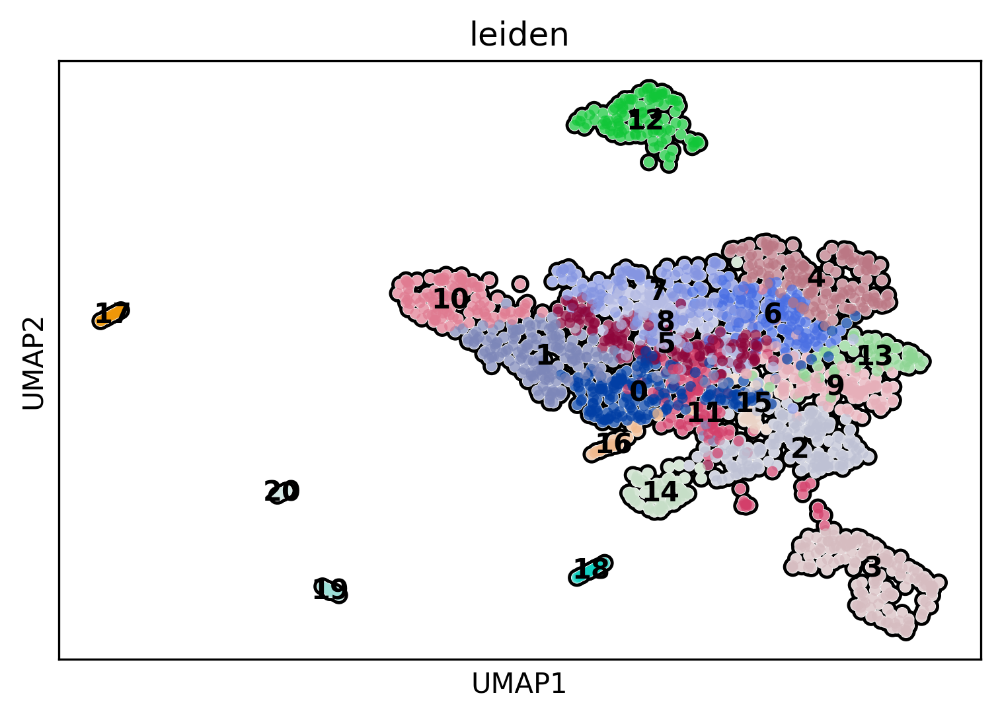

In [43]:
sc.pl.umap(adata, color=['leiden'], add_outline=True, legend_loc='on data')

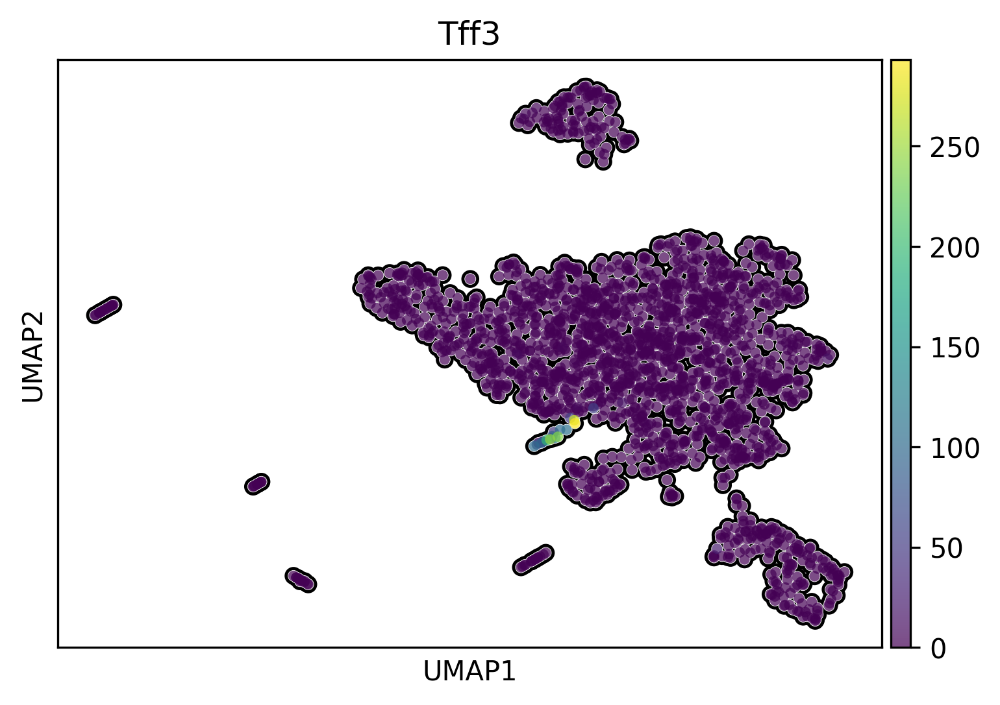

In [48]:
sc.pl.umap(adata, color=['Tff3'], add_outline=True)

In [ ]:
Spink4

In [ ]:
Ern2

In [ ]:
Muc13

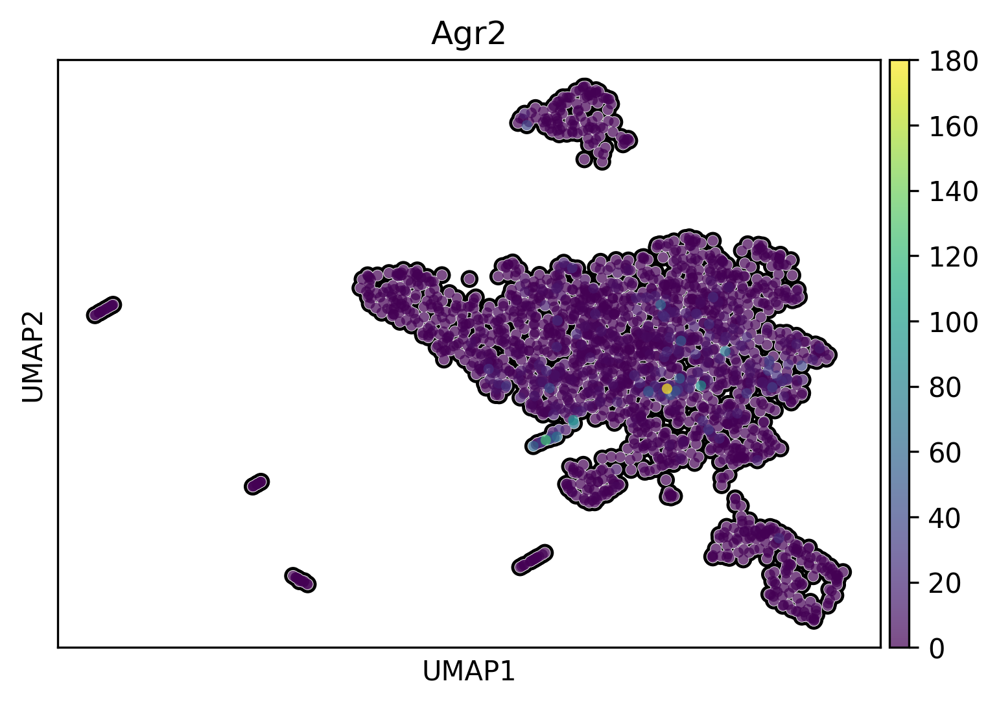

In [64]:
sc.pl.umap(adata, color=['Agr2'], add_outline=True)

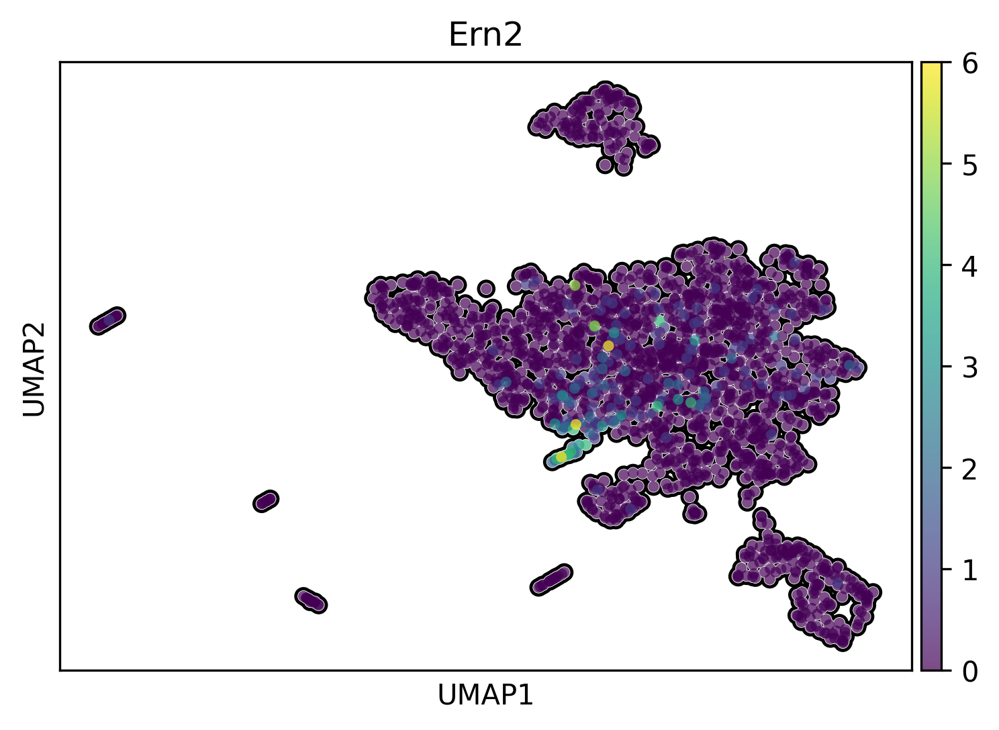

In [61]:
sc.pl.umap(adata, color=['Ern2'], add_outline=True)

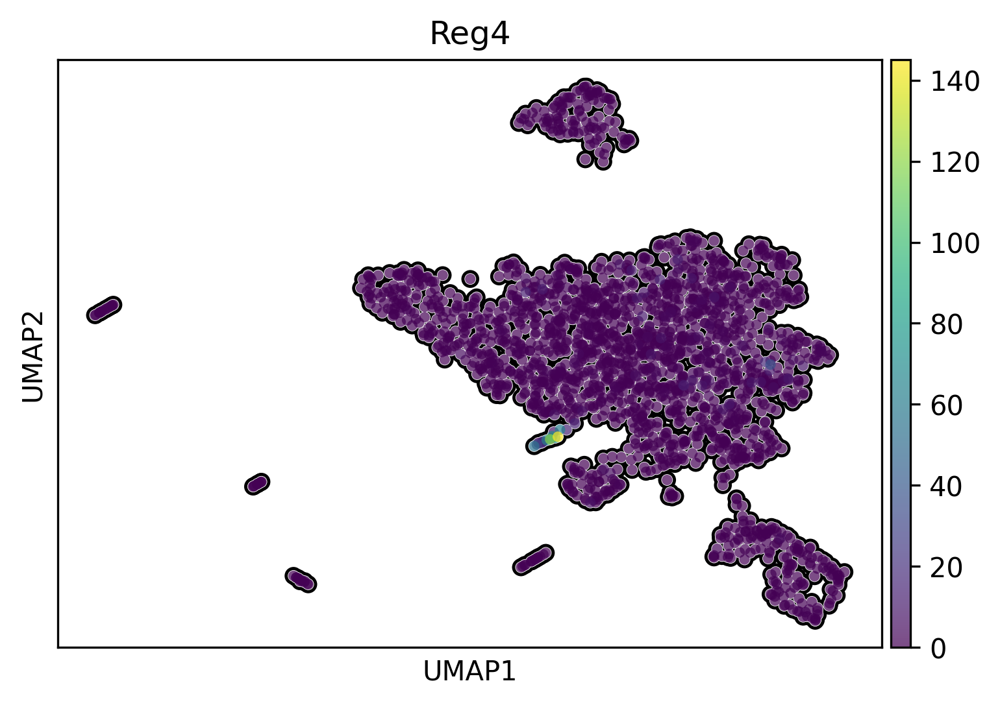

In [63]:
sc.pl.umap(adata, color=['Reg4'], add_outline=True)

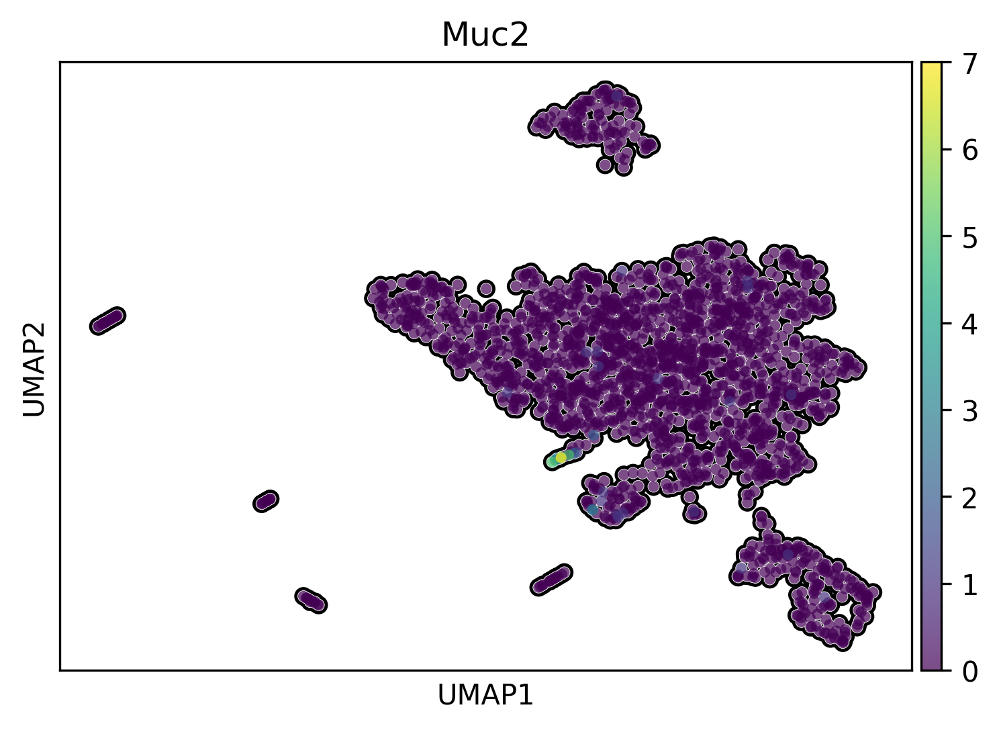

In [65]:
sc.pl.umap(adata, color=['Muc2'], add_outline=True)

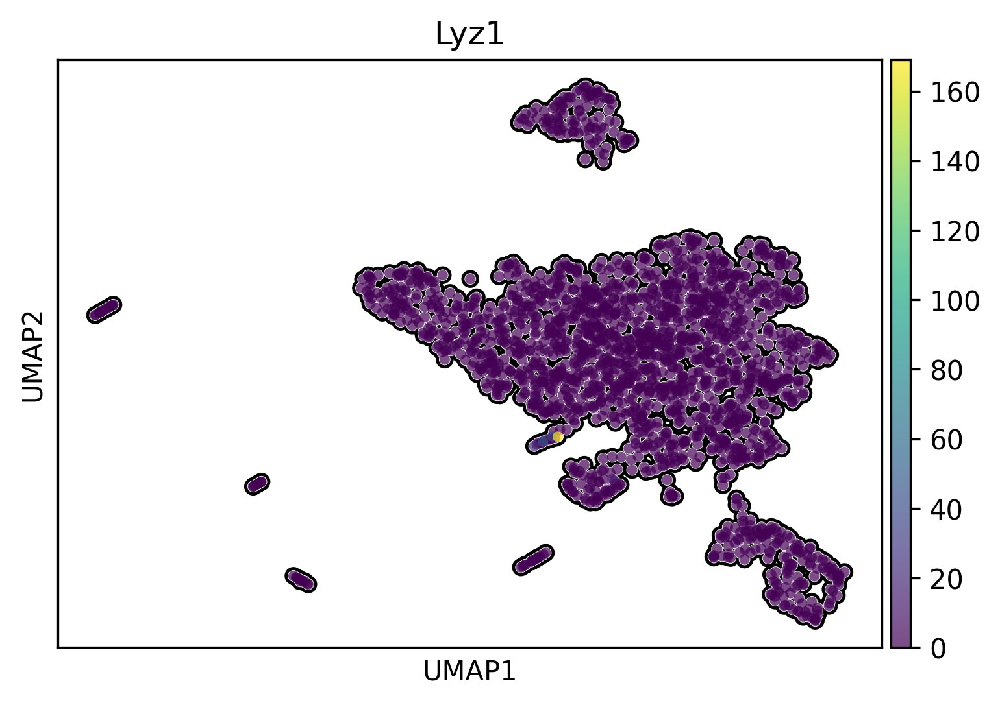

In [71]:
sc.pl.umap(adata, color=['Lyz1'], add_outline=True)

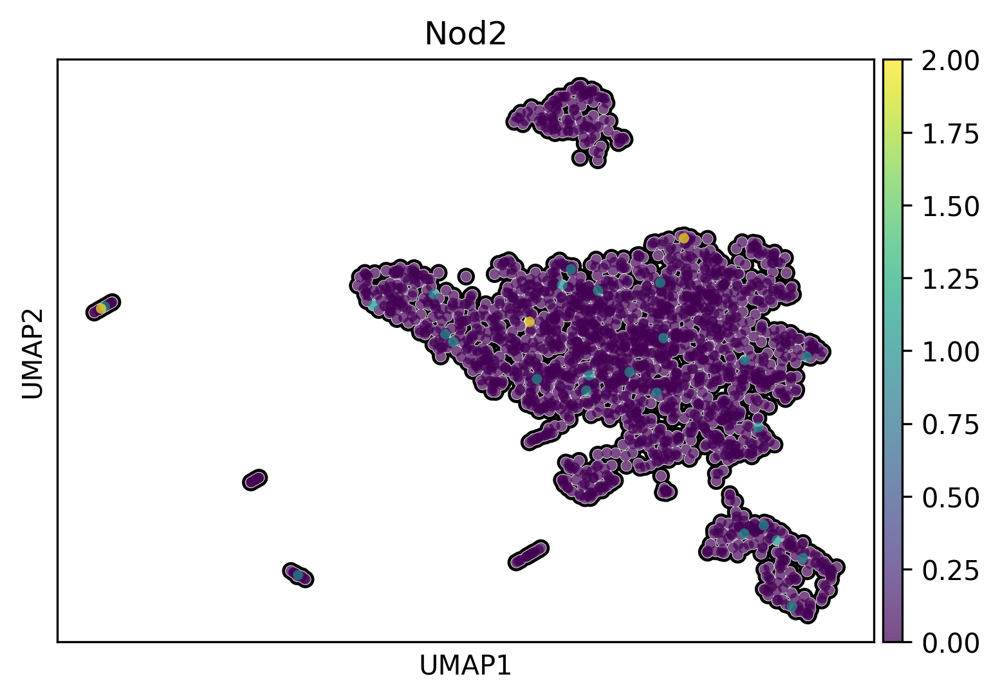

In [72]:
sc.pl.umap(adata, color=['Nod2'], add_outline=True)

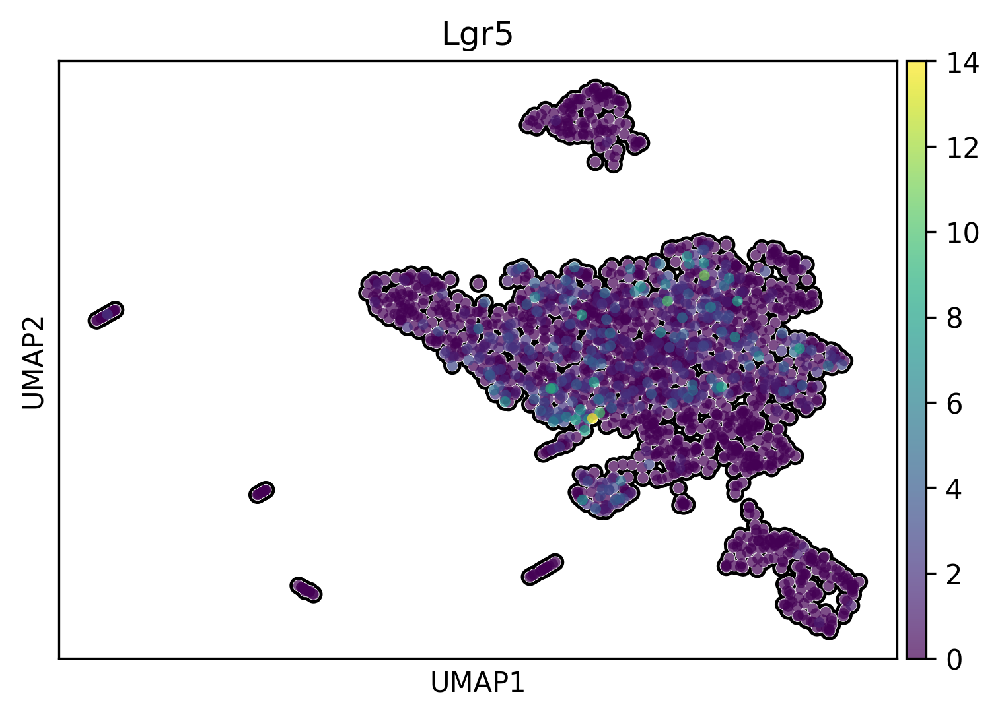

In [73]:
sc.pl.umap(adata, color=['Lgr5'], add_outline=True)

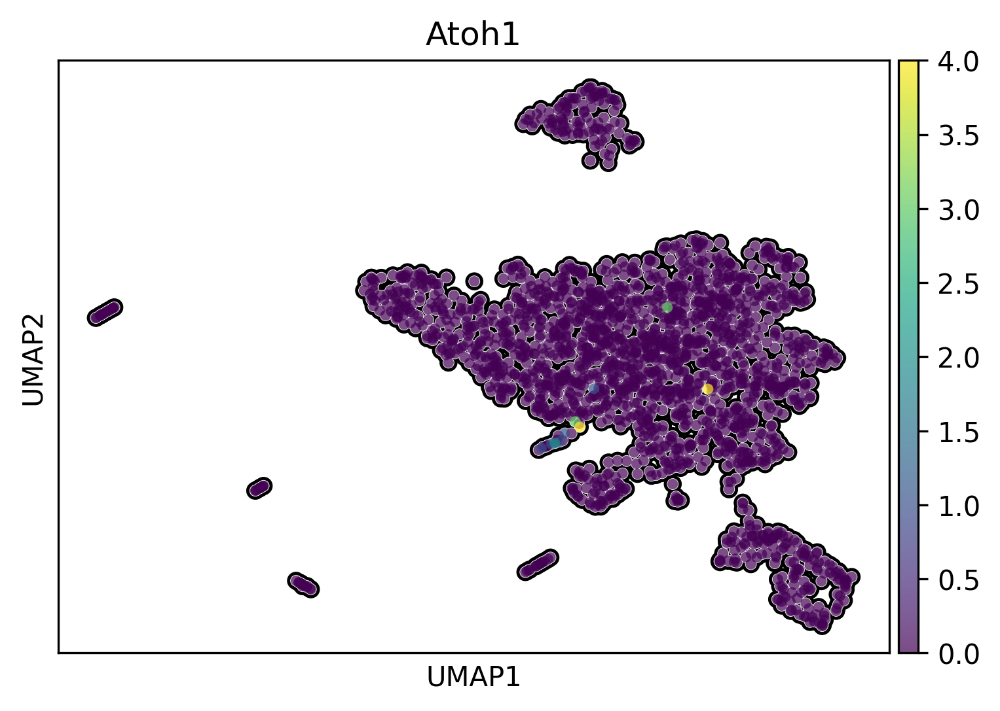

In [78]:
sc.pl.umap(adata, color=['Atoh1'], add_outline=True)

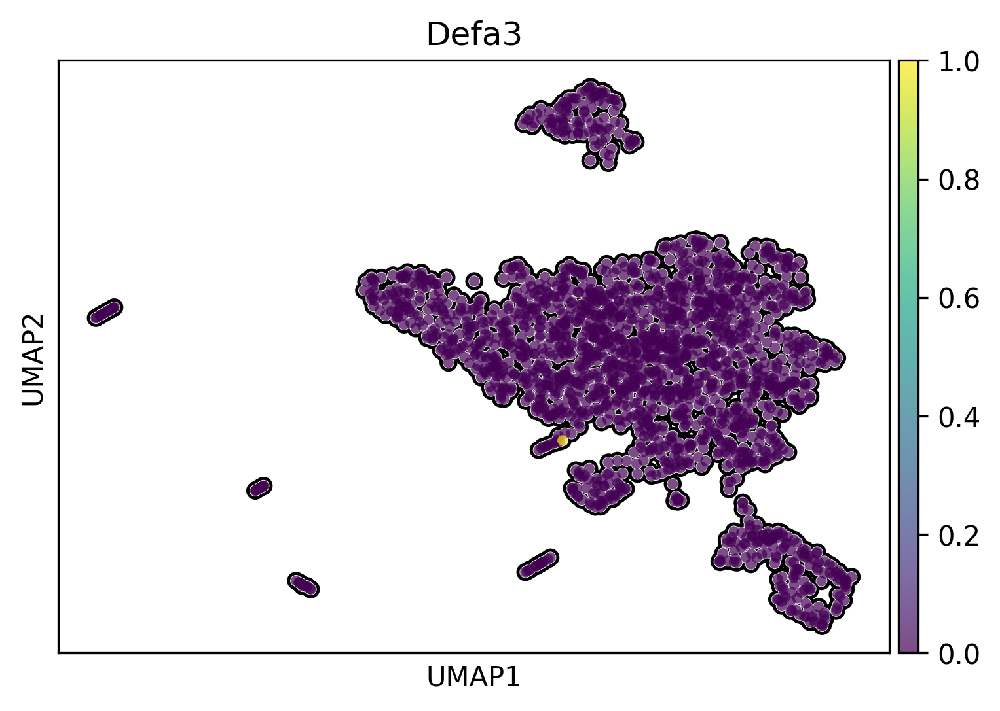

In [83]:
sc.pl.umap(adata, color=['Defa3'], add_outline=True)

KeyError: 'Defa4'

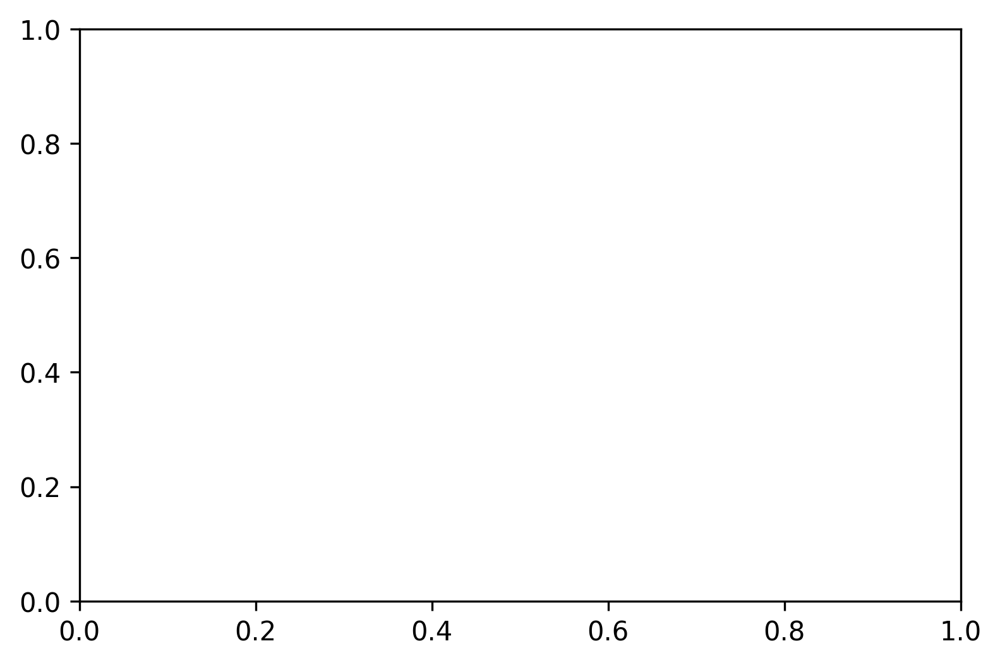

In [84]:
sc.pl.umap(adata, color=['Defa4'], add_outline=True)

In [ ]:
sc.pl.umap(adata, color=['Lyz1'], add_outline=True)

In [ ]:
sc.pl.umap(adata, color=['Lyz1'], add_outline=True)

In [ ]:
sc.pl.umap(adata, color=['Lyz1'], add_outline=True)

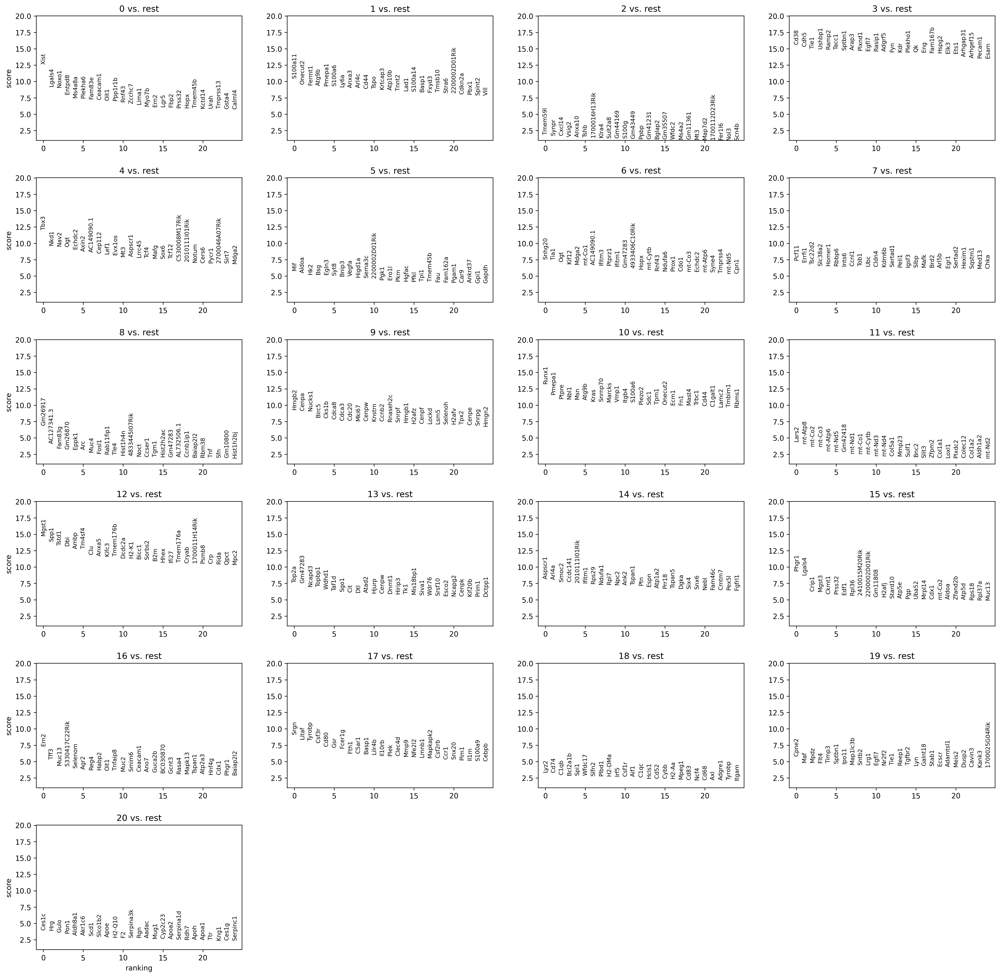

In [36]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [28]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)


,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,Xist,S100a11,Tmem59l,Cd38,Tbx3,Mif,Snhg20,Pcf11,Gm26917,Hmgb2,...,Lars2,Mgst1,Top2a,Aspscr1,Phgr1,Ern2,Srgn,Lyz2,Cpne2,Ces1c
1,Lgals4,Onecut2,Synpr,Cdh5,Nkd1,Aldoa,Tia1,Errfi1,AC127341.3,Cenpa,...,mt-Atp8,Spp1,Gm47283,Arl4a,Lgals4,Tff3,Litaf,Cd74,Maf,Hrg
2,Noxo1,Fermt1,Cxcl14,Tie1,Nav2,Hk2,Ogt,Tsc22d2,Fam83g,Nucks1,...,mt-Co2,Tstd1,Ncapd3,Smoc2,Crip1,Muc13,Tyrobp,C1qb,Mpdz,Gulo
3,Entpd8,Atg9b,Vsig2,Ushbp1,Ogt,Bsg,Kif12,Slc38a2,Gm26870,Birc5,...,mt-Co3,Dbi,Topbp1,Ccdc141,Mgst3,5330417C22Rik,Csf3r,Bcl2a1b,Flt4,Pon1
4,Ms4a8a,Pmepa1,Anxa10,Ramp2,Echdc2,Egln3,Mdga2,Homer1,Eppk1,Cks1b,...,mt-Atp6,Ambp,Wdhd1,2010111I01Rik,Ckmt1,Selenom,Cd80,Spi1,Timp3,Aldh8a1
5,Plekha6,S100a6,Tshb,Tacc1,Axin2,Syt8,mt-Co1,Rbbp6,Arc,Cdca8,...,mt-Nd5,Tm4sf4,Taf1d,Ifitm1,Prss32,Agr2,Gsr,Wfdc17,Sptbn1,Akr1c6
6,Fam83e,Ly6a,1700016H13Rik,Sptbn1,AC149090.1,Bnip3,AC149090.1,Ints6,Muc4,Cdca3,...,Gm42418,Clu,Sgo1,Rps29,Edf1,Reg4,Fcer1g,Slfn2,Ipo11,Scd1
7,Ceacam1,Anxa3,Klra4,Arap3,Cep112,Vegfa,Ifitm3,Ccnl1,Fosl1,Cdc20,...,mt-Nd1,Anxa5,Cit,Ndufa1,Rpl36,Habp2,Fth1,Plbd1,Map1lc3b,Slco1b2
8,Oit1,Arl4c,Sult2a8,Plxnd1,Lef1,Higd1a,Ptprz1,Tob1,Rab11fip1,Mki67,...,mt-Co1,Kifc3,Dtl,Rpl7,2410015M20Rik,Oit1,C5ar1,H2-DMa,Sntb2,Apoe
9,Ppp1r1b,Cd44,Gm44169,Egfl7,Evx1os,Sema3c,Ifitm1,Ubc,Tle4,Cenpw,...,mt-Cytb,Tmem176b,Atad2,Npc2,2200002D01Rik,Tnfaip8,Basp1,Irf5,Lrg1,H2-Q10


In [13]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(10)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,6_n,6_p,7_n,7_p,8_n,8_p,9_n,9_p,10_n,10_p
0,Tbx3,3.917038e-26,Lgals4,9.371795e-26,Pmepa1,7.825960e-40,Cd38,4.590867e-33,Mgst1,2.262849e-27,...,Srgn,2.798524e-07,Lyz2,0.004932,Cpne2,0.000082,Ces1c,0.003235,Kalrn,0.009614
1,Mdga2,1.107504e-23,Ppp1r1b,1.197883e-17,Cd44,9.366693e-36,Cdh5,2.276390e-32,Spp1,1.411772e-25,...,Litaf,6.388706e-07,Cd74,0.005492,Maf,0.000357,Hrg,0.003314,Fzd1,0.010411
2,Wnt6,6.226180e-19,Cenpw,2.311875e-16,Atg9b,2.049634e-35,Ushbp1,5.884697e-32,Tstd1,3.687917e-24,...,Tyrobp,1.118162e-06,C1qb,0.010849,Mpdz,0.000392,Gulo,0.005377,Tgfb3,0.011778
3,Ifitm1,4.482057e-18,Noxo1,3.969095e-16,Runx1,1.241538e-34,Ramp2,1.370320e-31,Dbi,3.719757e-24,...,Csf3r,1.671474e-06,Bcl2a1b,0.012396,Flt4,0.000418,Pon1,0.006764,Col5a1,0.012040
4,Cep112,8.042232e-18,Hmgb2,1.020411e-15,Onecut2,1.168184e-34,Tie1,1.612221e-31,Ambp,4.599695e-23,...,Cd80,3.842096e-06,Spi1,0.012597,Timp3,0.000450,Aldh8a1,0.011359,P3h1,0.012071
5,Mt3,3.903890e-17,Plac8,1.528236e-15,Anxa3,1.929732e-33,Egfl7,3.355917e-31,Tm4sf4,4.715162e-23,...,Gsr,4.776737e-06,Wfdc17,0.012738,Sptbn1,0.000503,Akr1c6,0.011402,Fkbp14,0.015239
6,Pdgfrl,1.133778e-16,Cdca8,6.762854e-15,S100a6,4.822642e-33,Plxnd1,3.944775e-31,Clu,3.976541e-21,...,Fcer1g,5.811478e-06,Slfn2,0.014746,Ipo11,0.000533,Scd1,0.012405,Zfpm2,0.015357
7,Sbspon,1.364860e-16,Birc5,6.454674e-15,Basp1,1.734236e-32,Arap3,5.106705e-31,Anxa5,1.102412e-20,...,Fth1,2.021390e-05,Plbd1,0.014776,Map1lc3b,0.000631,Slco1b2,0.015105,Plxdc2,0.018982
8,Slc30a2,1.660326e-16,Nucks1,9.565667e-15,S100a14,5.922956e-32,Rasip1,9.582059e-31,Kifc3,1.309019e-20,...,C5ar1,2.087060e-05,H2-DMa,0.015026,Sntb2,0.000715,Apoe,0.017377,Mpp6,0.019704
9,Axin2,2.055544e-16,Phgr1,2.341514e-14,S100a11,7.564707e-32,Fyn,1.579469e-30,Tmem176b,1.309878e-20,...,Basp1,2.341681e-05,Irf5,0.015719,Lrg1,0.000746,H2-Q10,0.018144,Bnc2,0.020407


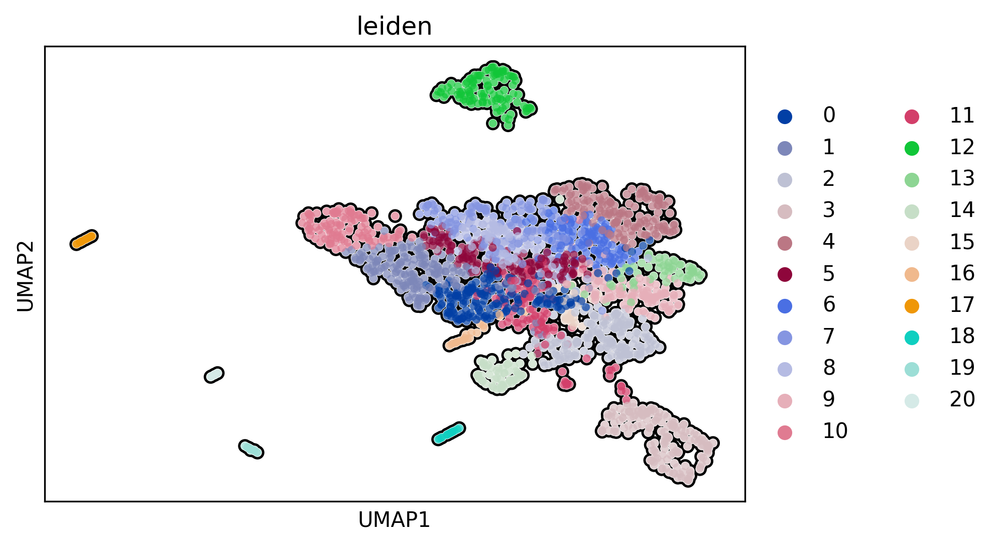

In [51]:
sc.pl.umap(adata, color=['leiden'],add_outline=True)


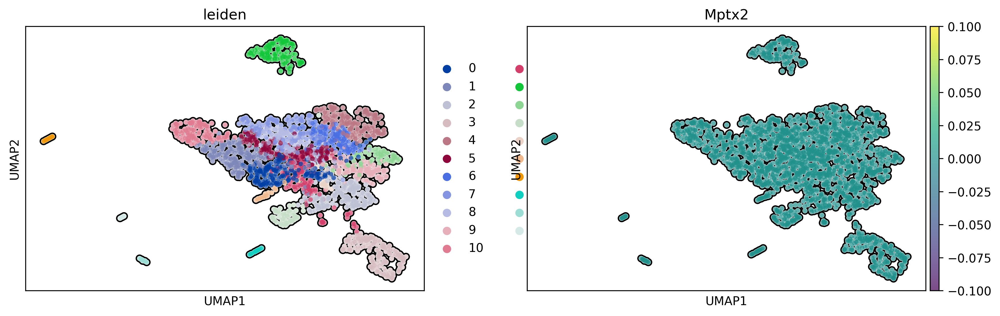

In [53]:
sc.pl.umap(adata, color=['leiden', 'Mptx2'], add_outline=True)


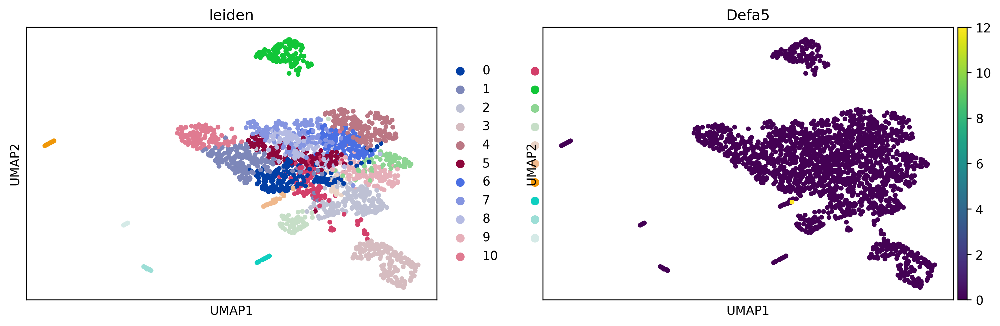

In [57]:
sc.pl.umap(adata, color=['leiden', 'Defa5'])


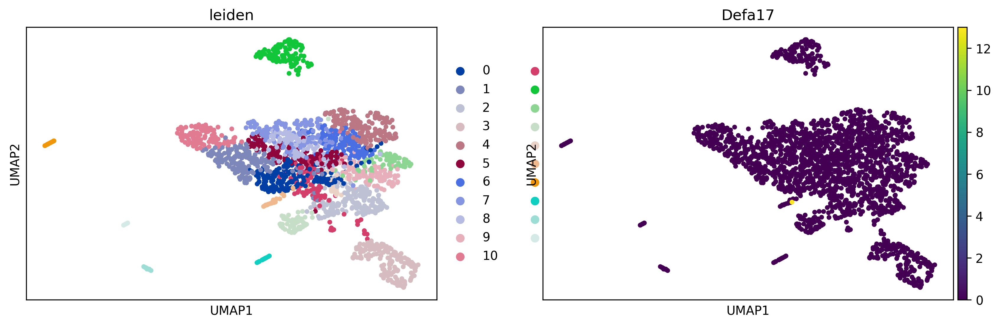

In [56]:
sc.pl.umap(adata, color=['leiden', 'Defa17'])


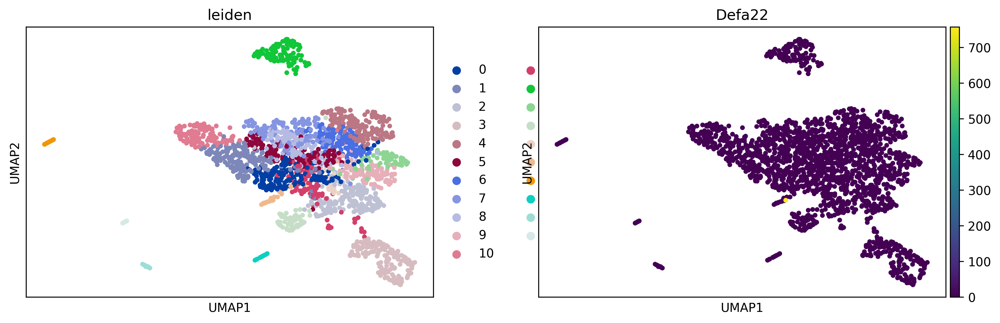

In [23]:
sc.pl.umap(adata, color=['leiden', 'Defa22'])


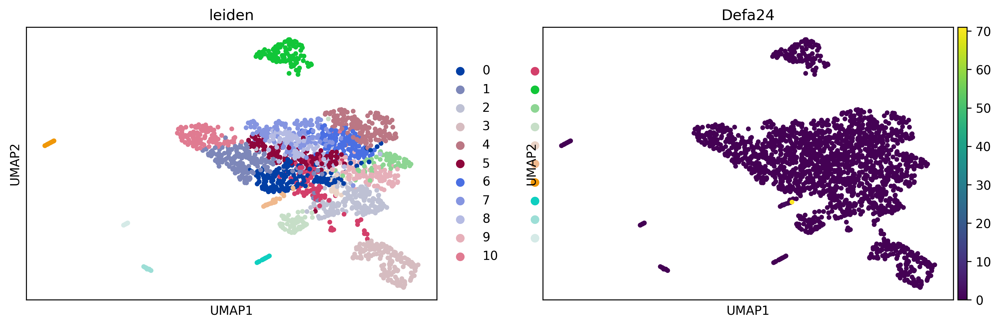

In [24]:
sc.pl.umap(adata, color=['leiden', 'Defa24'])


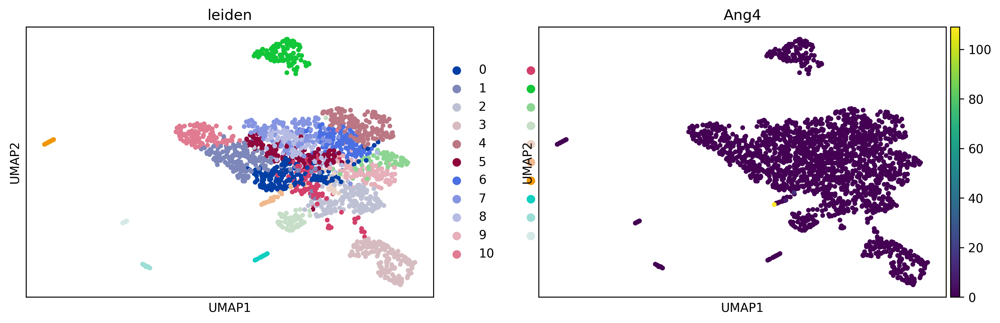

In [25]:
sc.pl.umap(adata, color=['leiden', 'Ang4'])


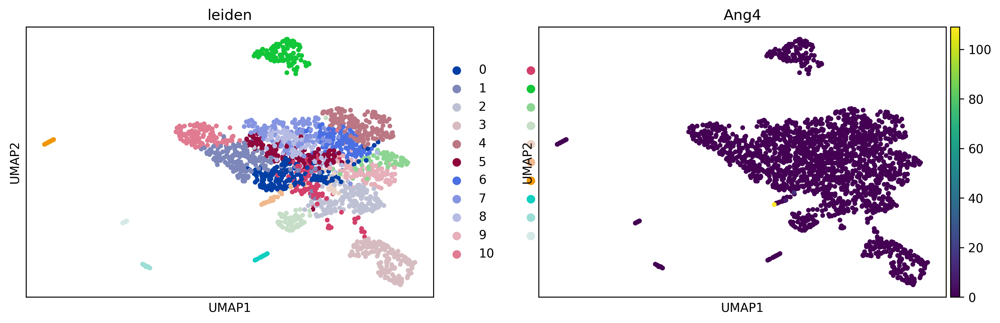

In [58]:
sc.pl.umap(adata, color=['leiden', 'Ang4'])
